In [ ]:
import numpy as np
from h5py import File
from neuromodes import EigenSolver
from neuromodes.io import fetch_example_surf
import matplotlib.pyplot as plt
from scipy.sparse import triu
from nsbutils.plotting_pyvista import plot_surf
from lapy import Solver
from neuromodes.stats import stdw
from neuromodes.waves import sim_nft_waves

In [2]:
path_to_fc = "C:/Users/ipop0003/ModeDivergence/data/OLD/fsLR_32k_dense_groupFC_zcorr_triu_site=HCP_cohort=S1003_cortex-lh.mat"

In [3]:
def triu_matlab_to_numpy(triu_vec):
    """Convert a vector representing the upper triangular part of a matrix (excluding diagonal) from
    MATLAB format to the numpy upper triangular format."""
    
    # 1. Flatten to guarantee a 1D shape
    triu_vec = np.asarray(triu_vec).ravel()
    
    # 2. Use .size instead of len() to handle the total number of elements safely
    n = int((1 + np.sqrt(1 + 8 * triu_vec.size)) / 2)  
    
    row_idx, col_idx = np.triu_indices(n, k=1)
    
    # 3. Use analytical indexing instead of np.argsort for massive speed/memory gains
    # In a col-major upper triangle, elements before column 'c' = c * (c - 1) / 2
    matlab_idx = (col_idx * (col_idx - 1)) // 2 + row_idx

    # Return vector reordered to NumPy format
    return triu_vec[matlab_idx]

def mask_to_triu(mask):
    row_idx, col_idx = np.triu_indices(len(mask), k=1)
    print("Done computing triu indices")
    return mask[row_idx] & mask[col_idx]

In [4]:
# test triu_matlab_to_numpy with a simple example
matlab_vec = np.arange(6)
numpy_vec = triu_matlab_to_numpy(matlab_vec)
print(numpy_vec)  # should print [0, 1, 3, 2, 4, 5]

[0 1 3 2 4 5]


In [5]:
with File(path_to_fc, 'r') as f:
    n_verts = int(f['matrix_size'][0][0])
    print(f"Number of vertices: {n_verts}")

    # Ensure it's flattened right out of the gate
    fc = f['zFC_triu'][:].astype(np.float32).ravel()
    print(f"FC data shape: {fc.shape}")
    print(f"First 10 values of FC data: {fc[:10]}")

    # Reorder FC from MATLAB to NumPy
    fc = triu_matlab_to_numpy(fc)

Number of vertices: 32492
FC data shape: (527848786,)
First 10 values of FC data: [0.20031467 0.1719932  0.34597978 0.3601634  0.14806777 0.51124245
 0.09619997 0.39205638 0.28705698 0.10520796]


In [7]:
# Assuming fetch_example_surf and EigenSolver are defined
surf, medmask = fetch_example_surf()
solver = EigenSolver(surf, medmask)
medmask_vec = mask_to_triu(medmask)

Done computing triu indices


In [8]:
assert len(medmask_vec) == fc.size, "Length of medmask_vec does not match length of FC data"

# Mask FC - We no longer need the [0, ...] indexing because fc is strictly 1D
fc = fc[medmask_vec]

# Check that masked FC is correct length
assert solver.n_verts == int((1 + np.sqrt(1 + 8 * fc.size)) / 2), "Number of vertices in FC does not match number of vertices in solver"

n_nans = np.isnan(fc).sum()
assert n_nans == 0, f"FC data contains {n_nans} NaNs, indicating a mismatch between medmask and FC data"

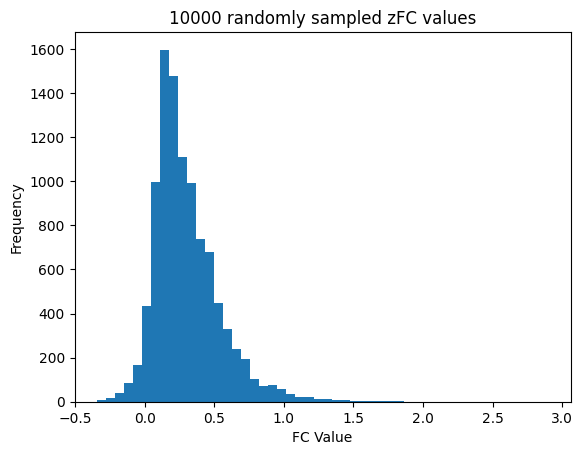

In [9]:
n_vals = 10000

# randomly sample n_vals values from the FC vector
indices = np.random.choice(len(fc), size=n_vals, replace=True)
fc_sampled = fc[indices]

# plot histogram of sampled FC values
plt.hist(fc_sampled, bins=50)
plt.title(f'{n_vals} randomly sampled zFC values')
plt.xlabel('FC Value')
plt.ylabel('Frequency')
plt.show()

In [11]:
fc_mean = np.mean(fc)
print(f"FC mean: {fc_mean}, FC std: {fc.std()}")

FC mean: 0.3046278655529022, FC std: 0.24812141060829163


In [86]:
# 1. Extract ONLY the strictly upper triangle of the stiffness matrix as COO format
# This gives us direct, flat access to the non-zero rows, cols, and data.
upper_stiffness = triu(solver.stiffness, k=1).tocoo()

r = upper_stiffness.row
c = upper_stiffness.col

# 2. Compute the exact 1D indices in the upper triangular FC vector
# Using the analytical row-major formula:
fc_indices = r * solver.n_verts - (r * (r + 1)) // 2 + c - r - 1

fc_mesh_edges = fc[fc_indices]

In [99]:
np.save('C:/Users/ipop0003/neuromodes/hcp1007_fc_fslr-32k-lh_mesh-edges-triu.npy', fc_mesh_edges)

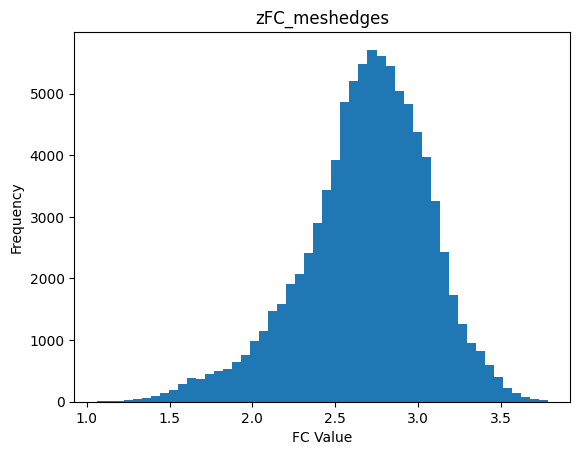

In [98]:
# plot histogram of sampled FC values
plt.hist(fc_mesh_edges, bins=50)
plt.title('zFC_meshedges')
plt.xlabel('FC Value')
plt.ylabel('Frequency')
plt.show()

In [96]:
alpha = 10.0
fc_sig = 2 / (1 + np.exp(-alpha * (fc_mesh_edges - np.mean(fc_mesh_edges))))

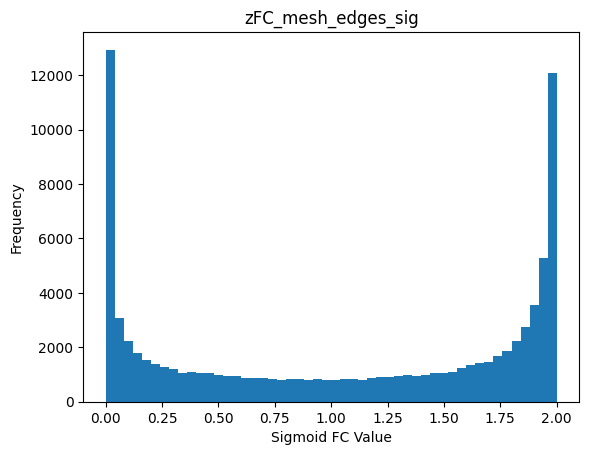

In [97]:
# plot histogram of sampled FC_sig values
plt.hist(fc_sig, bins=50)
plt.title('zFC_mesh_edges_sig')
plt.xlabel('Sigmoid FC Value')
plt.ylabel('Frequency')
plt.show()

In [100]:
# 3. Multiply the sparse off-diagonal data directly by the FC values
# This completely bypasses the slow sparse index assignment!
upper_stiffness.data *= fc_sig

# 4. Reconstruct the symmetric matrix by adding the transpose
stiffness_fcmod = upper_stiffness + upper_stiffness.T

# 5. Adjust the diagonal to ensure zero row-sums
# Because stiffness_fcmod currently has a zero diagonal, 
# the new diagonal is simply the negative sum of the off-diagonals.
new_diag = -np.asarray(stiffness_fcmod.sum(axis=0)).ravel()
stiffness_fcmod.setdiag(new_diag)

# (Optional) Convert back to CSC format if your solver strictly requires it
stiffness_fcmod = stiffness_fcmod.tocsc()

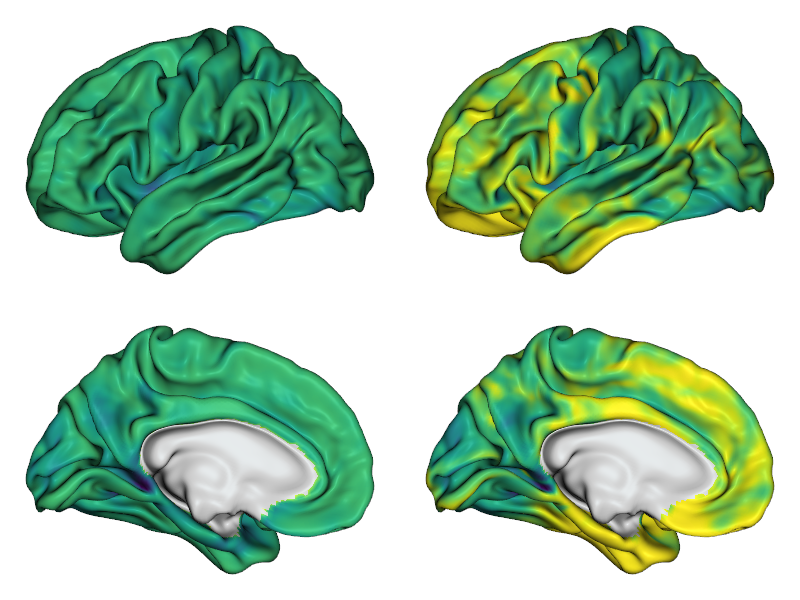

In [103]:
# plot stiffness rowsum (except diagonal) before and after FC modulation
stiffness_rowsums = -np.stack([solver.stiffness.diagonal(), stiffness_fcmod.diagonal()], axis=1)
fig = plot_surf({'lh': surf}, {'lh': solver.unmask_data(stiffness_rowsums)}, cmap='viridis', views=['lateral', 'medial'], layout_indiv='col', zoom=1.5)
fig.show(jupyter_backend='static')

In [104]:
n_modes = 100

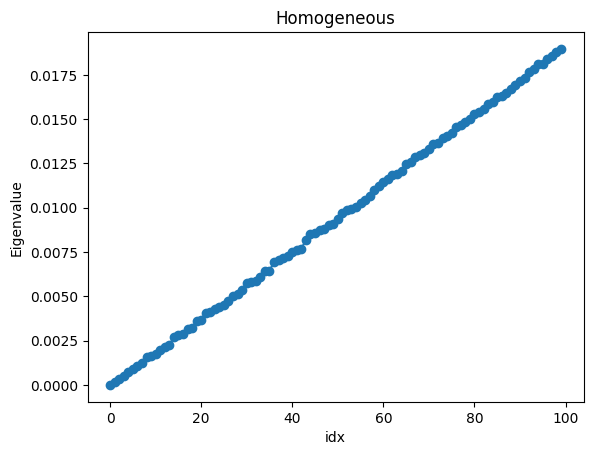

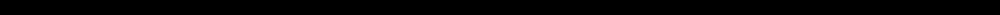

In [ ]:
# plot old eigenmodes
evals, emodes = Solver(solver.geometry).eigs(n_modes, rng=0)

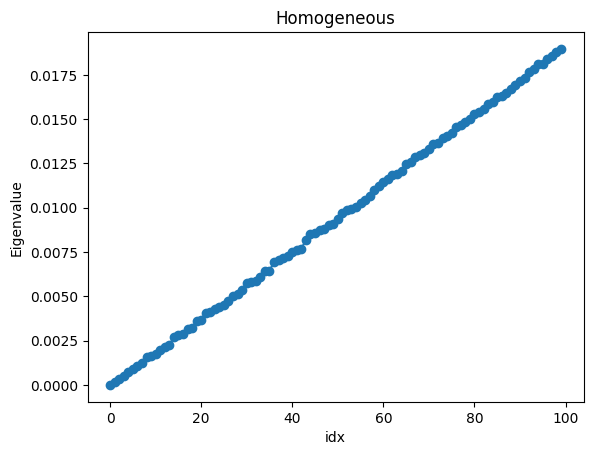

In [72]:
plt.plot(evals, marker='o')
plt.xlabel('idx')
plt.ylabel('Eigenvalue')
plt.title('Homogeneous')
plt.show()

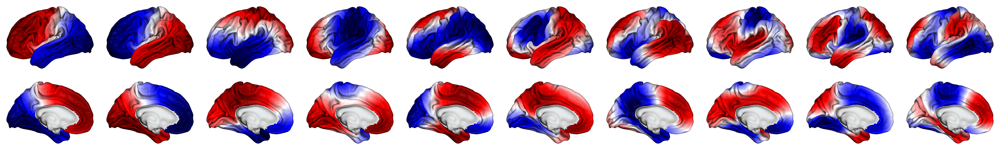

In [73]:
fig = plot_surf({'lh': surf}, {'lh': solver.unmask_data(emodes[:, :10])}, cmap='seismic', views=['lateral', 'medial'], layout_indiv='col', zoom=1.5)
fig.show(jupyter_backend='static')

In [105]:
# calculate new eigenmodes
solver_fcmod = Solver(solver.geometry)
solver_fcmod.stiffness = stiffness_fcmod

# check that stiffness is different
assert solver_fcmod.stiffness.data.shape == solver.stiffness.data.shape, "Stiffness matrix shape changed after FC modulation"
assert not np.allclose(solver_fcmod.stiffness.data, solver.stiffness.data), "Stiffness matrix data did not change after FC modulation"

In [106]:
evals_modfc, emodes_modfc = solver_fcmod.eigs(n_modes, rng=0)

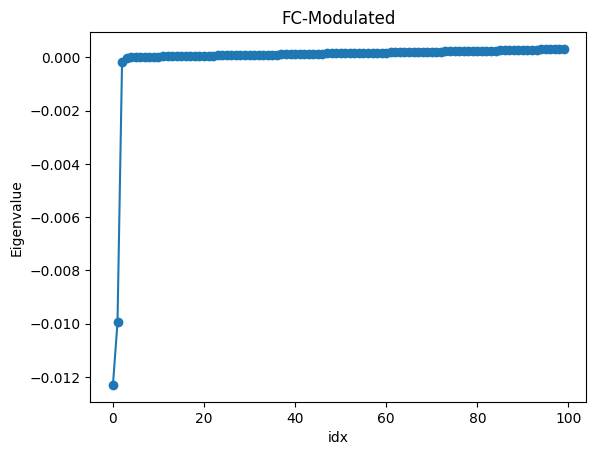

In [107]:
plt.plot(evals_modfc, marker='o')
plt.xlabel('idx')
plt.ylabel('Eigenvalue')
plt.title('FC-Modulated')
plt.show()

In [ ]:
fig = plot_surf({'lh': surf}, {'lh': solver.unmask_data(emodes_modfc[:, :10])}, cmap='seismic', views=['lateral', 'medial'], layout_indiv='col', zoom=1.5)
fig.show(jupyter_backend='static')

In [78]:
emode0_std = stdw(emodes[:, 0], solver.mass)
emode0_modfc_std = stdw(emodes_modfc[:, 0], solver.mass)

print("stdev of original emodes[:, 0]:", emode0_std)
print("stdev of FC-modulated emodes[:, 0]:", emode0_modfc_std)
print("Ratio of stdevs (modulated/original):", emode0_modfc_std / emode0_std)

stdev of original emodes[:, 0]: 4.521522591896781e-16
stdev of FC-modulated emodes[:, 0]: 1.8632953105415653e-16
Ratio of stdevs (modulated/original): 0.41209465897192654


In [70]:
# Try wave modelling
nt = 1000
dt = 1e-4
y_coords = solver.geometry.v[:, 1]
# get vertices in the bottom 5% of y-coords
y_threshold = np.percentile(y_coords, 5)
ext_vertices = np.where(y_coords < y_threshold)[0]
ext_input = np.zeros((solver.n_verts, nt))
ext_input[ext_vertices, 10:20] = 1.0  # brief pulse

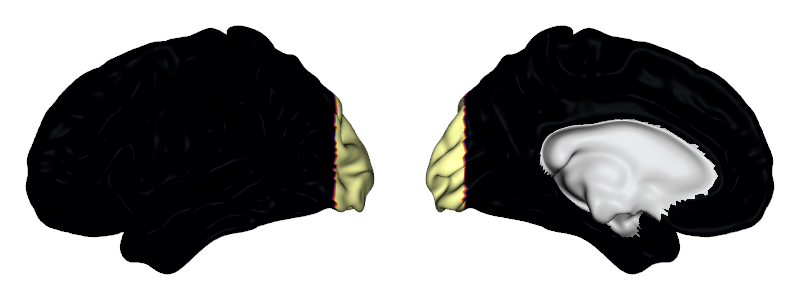

In [69]:
fig = plot_surf({'lh': surf}, {'lh': solver.unmask_data(ext_input[:, 15])}, cmap='inferno', views=['lateral', 'medial'], zoom=1.5)
fig.show(jupyter_backend='static')

In [79]:
waves = sim_nft_waves(emodes, evals, ext_input=ext_input, dt=dt, mass=solver.mass)

In [80]:
waves_modfc = sim_nft_waves(emodes_modfc, evals_modfc, ext_input=ext_input, dt=dt, mass=solver.mass)

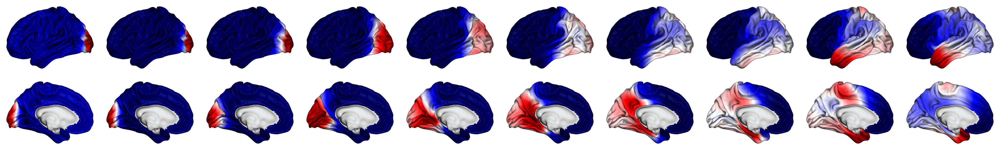

In [82]:
fig = plot_surf({'lh': surf}, {'lh': solver.unmask_data(waves[:, ::100])}, cmap='seismic', views=['lateral', 'medial'], layout_indiv='col', zoom=1.5)
fig.show(jupyter_backend='static')

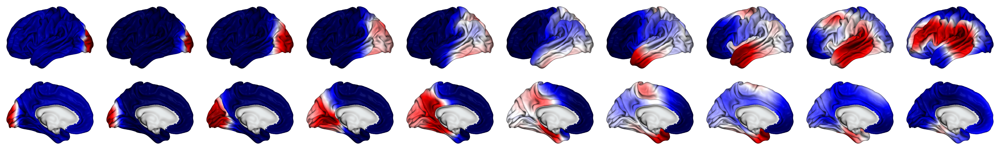

In [83]:
fig = plot_surf({'lh': surf}, {'lh': solver.unmask_data(waves_modfc[:, ::100])}, cmap='seismic', views=['lateral', 'medial'], layout_indiv='col', zoom=1.5)
fig.show(jupyter_backend='static')